# **Asheville AirBnb**

In [2]:
import pandas as pd
import numpy as np
import geopandas as gpd
import matplotlib.pyplot as plt
!pip install pysal
!pip install geoplot
import pysal
import splot
import re
import seaborn as sns
import folium


# For points map
import geoplot.crs as gcrs
import geoplot as gplt

In [3]:
# Open listings file
listings = pd.read_csv('/content/listings.csv',
                       usecols=['id', 'property_type', 'neighbourhood_cleansed',
                                'bedrooms', 'beds', 'bathrooms_text', 'price',
                                'latitude','longitude'])

# Rename column
listings = listings.rename(columns={'neighbourhood_cleansed':'neighbourhood'}).astype(object)

#listings.columns
listings.sample(4)

,id,neighbourhood,latitude,longitude,property_type,bathrooms_text,bedrooms,beds,price
3017,876288508011471275,28704,35.47362,-82.56391,Entire rental unit,1 bath,1.0,1.0,$87.00
897,31337044,28805,35.58141,-82.49794,Entire home,1 bath,1.0,2.0,$116.00
2110,53558640,28806,35.579502,-82.597618,Entire guest suite,1 bath,1.0,1.0,$115.00
2320,588559050060230555,28803,35.5487,-82.49087,Entire cottage,2 baths,2.0,2.0,$136.00


In [4]:
listings.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3239 entries, 0 to 3238
Data columns (total 9 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   id              3239 non-null   object
 1   neighbourhood   3239 non-null   object
 2   latitude        3239 non-null   object
 3   longitude       3239 non-null   object
 4   property_type   3239 non-null   object
 5   bathrooms_text  3238 non-null   object
 6   bedrooms        2768 non-null   object
 7   beds            3211 non-null   object
 8   price           3239 non-null   object
dtypes: object(9)
memory usage: 227.9+ KB


In [5]:
# Filling the NA in the bathroom text variable with zero
listings['bathrooms_text'].fillna('0 bath', inplace=True)

In [6]:
# Correcting the bathroom variable to numeric
listings['bathrooms'] = listings.bathrooms_text.apply(lambda x: re.findall('[\d+]', x)[0] if len(re.findall('[\d+]', x)) > 0 else 0)
listings['bathrooms'] = listings.bathrooms.astype(int)

# Delete bathrooms text
listings.drop('bathrooms_text', axis=1, inplace=True)

In [7]:
listings.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3239 entries, 0 to 3238
Data columns (total 9 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   id             3239 non-null   object
 1   neighbourhood  3239 non-null   object
 2   latitude       3239 non-null   object
 3   longitude      3239 non-null   object
 4   property_type  3239 non-null   object
 5   bedrooms       2768 non-null   object
 6   beds           3211 non-null   object
 7   price          3239 non-null   object
 8   bathrooms      3239 non-null   int64 
dtypes: int64(1), object(8)
memory usage: 227.9+ KB


In [8]:
# Correct Price to Float (Replace $ and , with nothing)
listings['price'] = (listings['price']
                     .replace("[$,]", "", regex=True)
                     .astype(float)
                     )

In [9]:
# Check if all correct
listings = listings.reindex(columns=str.split('id,neighbourhood,property_type,bedrooms,beds,bathrooms,latitude,longitude,price', sep=','))
listings.head(2)

,id,neighbourhood,property_type,bedrooms,beds,bathrooms,latitude,longitude,price
0,108061,28801,Entire rental unit,1.0,1.0,1,35.6067,-82.55563,100.0
1,4394761,28801,Entire rental unit,2.0,1.0,1,35.61244,-82.55724,114.0


In [10]:
listings.describe(include='all')

,id,neighbourhood,property_type,bedrooms,beds,bathrooms,latitude,longitude,price
count,3239.0,3239.0,3239,2768.0,3211.0,3239.000000,3239.00000,3239.00000,3239.000000
unique,3239.0,8.0,49,9.0,18.0,NaN,2849.00000,2908.00000,NaN
top,108061.0,28806.0,Entire home,1.0,1.0,NaN,35.59524,-82.55219,NaN
freq,1.0,939.0,1163,1120.0,1134.0,NaN,11.00000,9.00000,NaN
mean,NaN,NaN,NaN,NaN,NaN,1.485644,NaN,NaN,179.771843
std,NaN,NaN,NaN,NaN,NaN,0.808976,NaN,NaN,156.068212
min,NaN,NaN,NaN,NaN,NaN,0.000000,NaN,NaN,14.000000
25%,NaN,NaN,NaN,NaN,NaN,1.000000,NaN,NaN,95.000000
50%,NaN,NaN,NaN,NaN,NaN,1.000000,NaN,NaN,135.000000
75%,NaN,NaN,NaN,NaN,NaN,2.000000,NaN,NaN,212.500000


### Good insights from descriptive stats:
* 3239 observations
* 49 types of properties to rent in Asheville, NC. Mostly entire homes.
* On average, houses with 2 bedrooms, 1 to 2 bathrooms and $180 dollars.


In [11]:
#price
listings.price.describe()

count    3239.000000
mean      179.771843
std       156.068212
min        14.000000
25%        95.000000
50%       135.000000
75%       212.500000
max      2059.000000
Name: price, dtype: float64

In [12]:
np.quantile(listings['price'], 0.97)

538.3000000000006

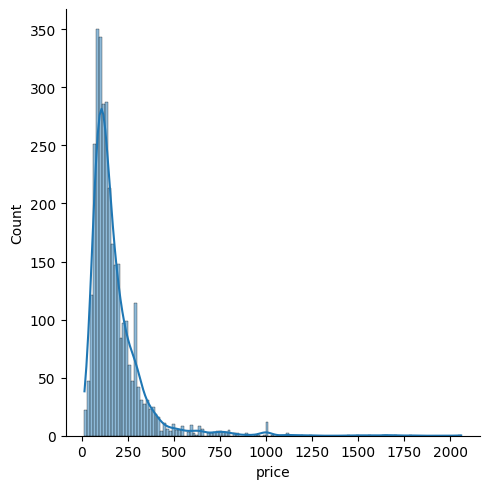

In [13]:
# Check price range
sns.displot(listings['price'], kde=True);

In [14]:
# Convert Pandas df to Geopandas df
listings_gpd = gpd.GeoDataFrame(listings,
                                geometry=gpd.points_from_xy(listings.longitude, listings.latitude, crs=4326))

In [15]:
# Look at the geometry variable created
listings_gpd.head(2)

,id,neighbourhood,property_type,bedrooms,beds,bathrooms,latitude,longitude,price,geometry
0,108061,28801,Entire rental unit,1.0,1.0,1,35.6067,-82.55563,100.0,POINT (-82.55563 35.60670)
1,4394761,28801,Entire rental unit,2.0,1.0,1,35.61244,-82.55724,114.0,POINT (-82.55724 35.61244)


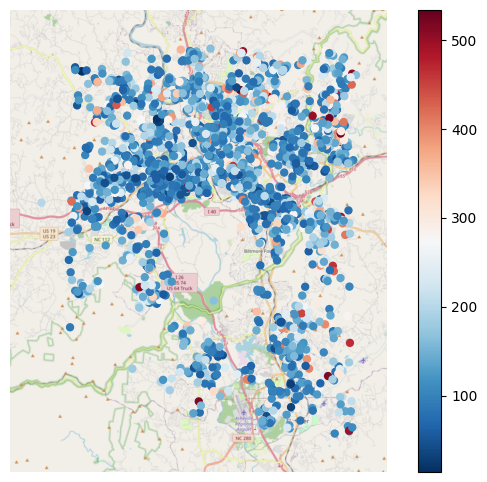

In [16]:
# Points map using geoplot
ax = gplt.webmap(listings_gpd.query('price < 538'), projection=gcrs.WebMercator())
gplt.pointplot(listings_gpd.query('price < 538'), cmap='RdBu_r', ax=ax, hue= 'price', legend=True);

In [17]:
# Reading the Asheville polygon shapefile (geojson)
geofile = '/content/neighbourhoods.geojson'
asheville = gpd.read_file(geofile)
asheville = asheville.to_crs(4326)

In [18]:
asheville.head(3)

,neighbourhood,neighbourhood_group,geometry
0,28806,NaN,"MULTIPOLYGON (((-82.64249 35.55649, -82.64249 ..."
1,28805,NaN,"MULTIPOLYGON (((-82.43149 35.68162, -82.42569 ..."
2,28804,NaN,"MULTIPOLYGON (((-82.58466 35.69498, -82.58475 ..."


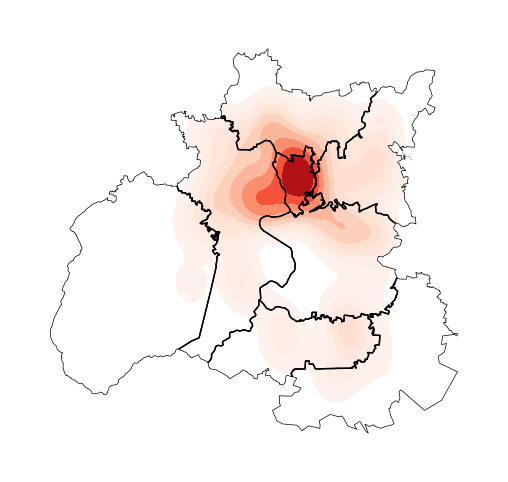

In [23]:
# Heatmap
ax = gplt.kdeplot(listings_gpd,
          fill=True, cmap='Reds',
          clip=asheville.geometry,
          projection=gcrs.WebMercator())

# Plotting the heatmap on top of the geometry
gplt.polyplot(asheville, ax=ax, zorder=1);

### Use folium

In [18]:
from numpy import Inf
# Create clip levels for prices
listings['price_bins']= pd.cut(listings.price,
       bins= [-Inf, 100, 200, 300, 400, 500, Inf],
       labels= ['0-100', '100-200', '200-300', '300-400', '400-500', '500+'])

# Create bin colors
listings['colors'] = listings.price_bins.map({'0-100': 'forestgreen', '100-200':'blue', '200-300':'gold', '300-400':'orange', '400-500':'red', '500+':'black'})
listings.head(2)

,id,neighbourhood,property_type,bedrooms,beds,bathrooms,latitude,longitude,price,price_bins,colors
0,108061,28801,Entire rental unit,1.0,1.0,1,35.6067,-82.55563,100.0,0-100,forestgreen
1,4394761,28801,Entire rental unit,2.0,1.0,1,35.61244,-82.55724,114.0,100-200,blue


In [19]:
m = folium.Map(location= [35.5951, -82.5515], zoom_start=10)
for lat, lon, ptcolor in zip(listings.latitude, listings.longitude, listings.colors):
  folium.CircleMarker(
     location=[lat, lon],
     radius=1.5,
     opacity=0.5,
     color=ptcolor,
     fill=True,
     fill_color=ptcolor,
  ).add_to(m)

In [ ]:
from folium import plugins

# Preparing data for plot
data = listings[['latitude','longitude', 'price']].values
data =data.tolist()

# Create Heat Map with Folium
hm = plugins.HeatMap(data,gradient={0.1: 'blue', 0.2: 'lime', 0.4: 'yellow', 0.6: 'orange', 0.9: 'red'},
                min_opacity=0.1,
                max_opacity=0.9,
                radius=20,
                use_local_extrema=False)

# Add to base map
hm.add_to(m);

# Display
m

In [26]:
# Add a choropleth layer
folium.Choropleth(
    geo_data=asheville,
    name="choropleth",
    data=listings,
    columns=["neighbourhood", "price"],
    key_on="feature.properties.neighbourhood",
    fill_color="RdBu_r",
    fill_opacity=0.5,
    line_opacity=0.5,
    legend_name="Prices",
).add_to(m)
m

In [ ]:
m = folium.Map(location= [35.5951, -82.5515], zoom_start=10, tiles="Stamen Terrain")

# Add a choropleth layer to a terrain map
folium.Choropleth(
    geo_data=asheville,
    name="choropleth",
    data=listings,
    columns=["neighbourhood", "price"],
    key_on="feature.properties.neighbourhood",
    fill_color="RdBu_r",
    fill_opacity=0.5,
    line_opacity=0.5,
    legend_name="Prices",
).add_to(m)
m

## Hypothesis Test

*First-order effect means that the observation varu from place to place, based on changes in the underlying area. Second-order effect means that the observation vary from place to place due to interaction effects between observations.*

* **Ho**: The data is distributed randomly accross space
* **Ha**: The data has spatial structure and is not randomly distributed

We use **Moran's I** to determine the hypothesis test result, which is a measure of *spatial autocorrelation*.

In [21]:
# packages for Hypothesis test
from pysal.explore import esda
from pysal.lib import weights
from esda.moran import Moran
from splot.esda import plot_moran
from splot import esda as esdaplot

/usr/local/lib/python3.10/dist-packages/spaghetti/network.py:40: FutureWarning: The next major release of pysal/spaghetti (2.0.0) will drop support for all ``libpysal.cg`` geometries. This change is a first step in refactoring ``spaghetti`` that is expected to result in dramatically reduced runtimes for network instantiation and operations. Users currently requiring network and point pattern input as ``libpysal.cg`` geometries should prepare for this simply by converting to ``shapely`` geometries.
  warnings.warn(dep_msg, FutureWarning, stacklevel=1)


In [22]:
# Generate weights Matrix W from the Geo Data
w = weights.Queen.from_dataframe(listings_gpd)


/usr/local/lib/python3.10/dist-packages/libpysal/cg/voronoi.py:173: FutureWarning: You are adding a column named 'geometry' to a GeoDataFrame constructed without an active geometry column. Currently, this automatically sets the active geometry column to 'geometry' but in the future that will no longer happen. Instead, either provide geometry to the GeoDataFrame constructor (GeoDataFrame(... geometry=GeoSeries()) or use `set_geometry('geometry')` to explicitly set the active geometry column.
  region_df["geometry"] = [Polygon(vertices[region]) for region in regions]
/usr/local/lib/python3.10/dist-packages/libpysal/cg/voronoi.py:176: FutureWarning: You are adding a column named 'geometry' to a GeoDataFrame constructed without an active geometry column. Currently, this automatically sets the active geometry column to 'geometry' but in the future that will no longer happen. Instead, either provide geometry to the GeoDataFrame constructor (GeoDataFrame(... geometry=GeoSeries()) or use `set_

In [23]:
# Row Standardization
w.transform = 'R'

/usr/local/lib/python3.10/dist-packages/splot/_viz_libpysal_mpl.py:115: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  centroids_shp = gdf.centroid.values
/usr/local/lib/python3.10/dist-packages/splot/_viz_libpysal_mpl.py:154: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  gdf.centroid.plot(ax=ax, **node_kws)


(<Figure size 1000x1000 with 1 Axes>, <Axes: >)

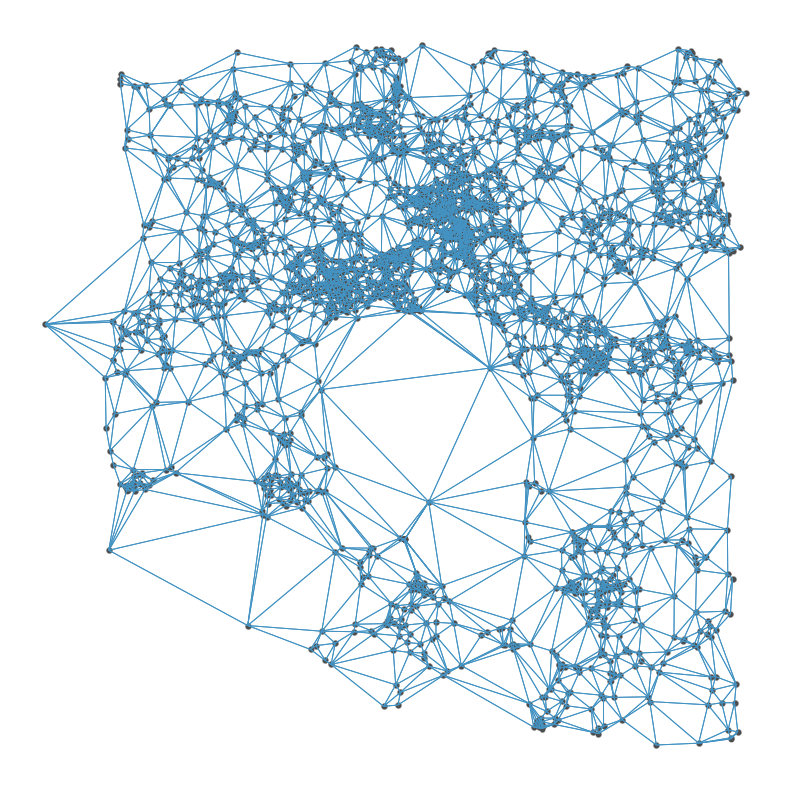

In [24]:
from splot.libpysal import plot_spatial_weights
plot_spatial_weights(w, listings_gpd)

In [25]:
# calculate the spatial lag
listings_gpd['price_lag'] = weights.spatial_lag.lag_spatial(w, listings_gpd['price'])

In [26]:
listings_gpd.head(2)

,id,neighbourhood,property_type,bedrooms,beds,bathrooms,latitude,longitude,price,geometry,price_lag
0,108061,28801,Entire rental unit,1.0,1.0,1,35.6067,-82.55563,100.0,POINT (-82.55563 35.60670),177.833333
1,4394761,28801,Entire rental unit,2.0,1.0,1,35.61244,-82.55724,114.0,POINT (-82.55724 35.61244),103.100000


In [27]:
# Standardize the variable of interest: easier to see the difference to the mean when plotting Moran's I
listings_gpd['price_std'] = ( listings_gpd['price'] - listings_gpd['price'].mean() )
listings_gpd['price_lag_std'] = ( listings_gpd['price_lag'] - listings_gpd['price_lag'].mean() )

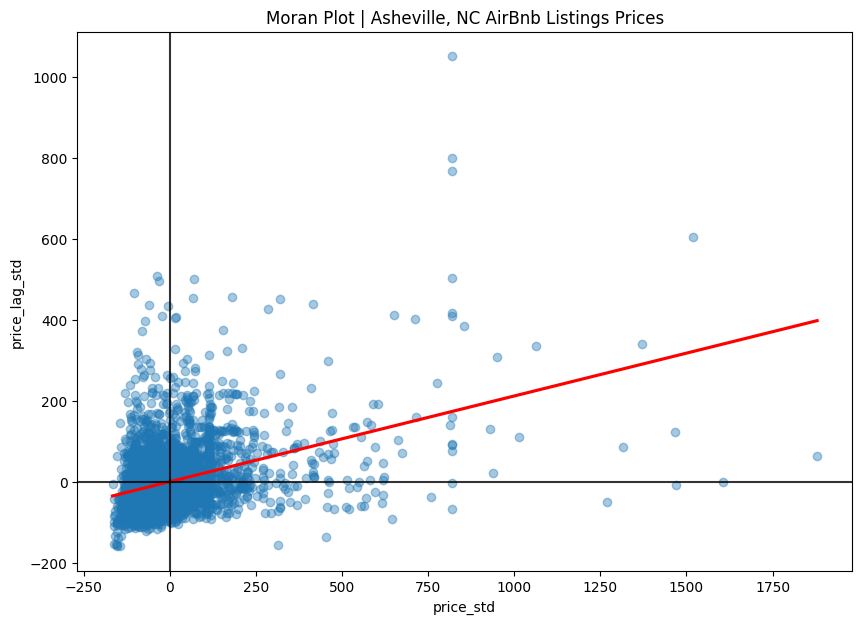

In [28]:
# Plotting Moran's I scatterplot
plt.figure(figsize=(10,7))

ax = sns.regplot(x= 'price_std', y= 'price_lag_std',
            ci=None, line_kws={'color':'r'}, scatter_kws= {'alpha': 0.4},
            data=listings_gpd)

ax.axvline(0, color='k', alpha=0.8)
ax.axhline(0, color='k', alpha=0.8)
ax.set_title('Moran Plot | Asheville, NC AirBnb Listings Prices');

In [29]:
# Calculating Moran's I for price (Global spatial correlation)
moran_stat = esda.moran.Moran(listings_gpd['price'], w)
print(f"Moran's I: {moran_stat.I}")
print(f"Moran's I p-Value: {moran_stat.p_sim}")

Moran's I: 0.2118266504045153
Moran's I p-Value: 0.001


/usr/local/lib/python3.10/dist-packages/splot/_viz_esda_mpl.py:354: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sbn.kdeplot(moran.sim, shade=shade, color=color, ax=ax, **kwargs)


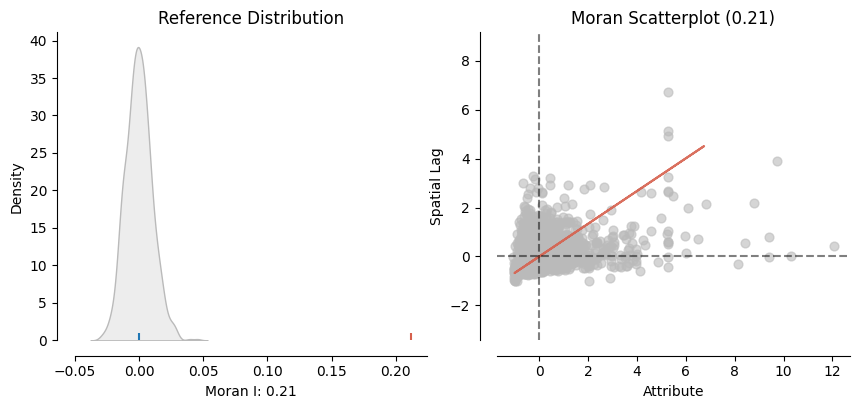

In [30]:
plot_moran(moran_stat);

In [25]:
# Local Spatial Correlation
price_local_I = esda.moran.Moran_Local(listings_gpd['price'], w)

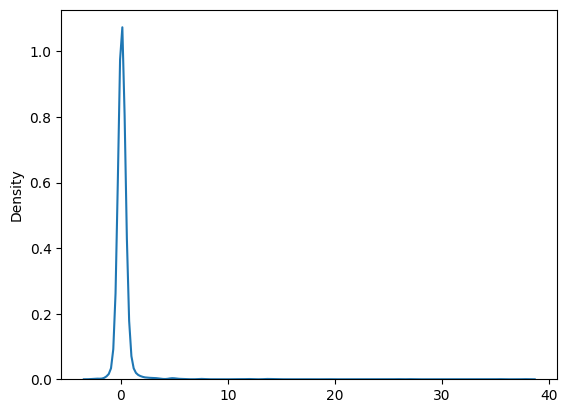

In [48]:
#Plotting the output density plot
sns.kdeplot(price_local_I.Is);

There is a huge spike around zero, aligned with the weak global correlation of 0.21.

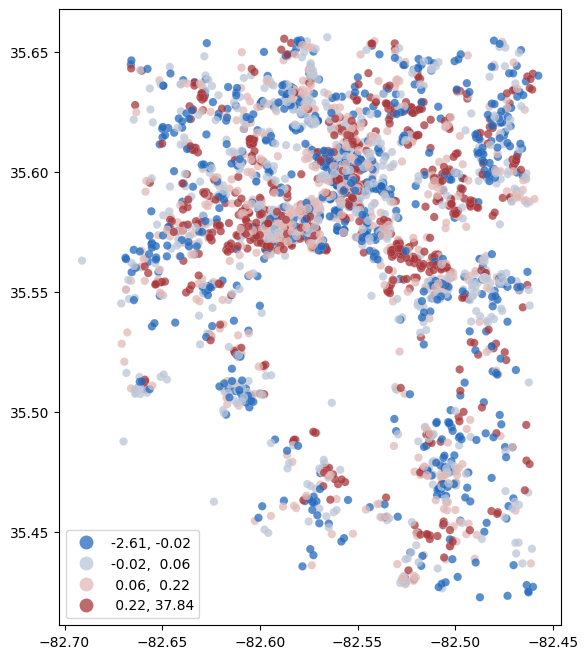

In [56]:
# Figure
f, ax = plt.subplots(1, figsize=(12,8))

# plot choropleth of local statistics
(listings_gpd
 .assign(ML_I = price_local_I.Is)
 .plot(column = 'ML_I', cmap='vlag',
       scheme='quantiles',
       k=4,
       edgecolor='white',
       linewidth= 0.1,
       alpha=0.75,
       legend=True,
       ax=ax)
);

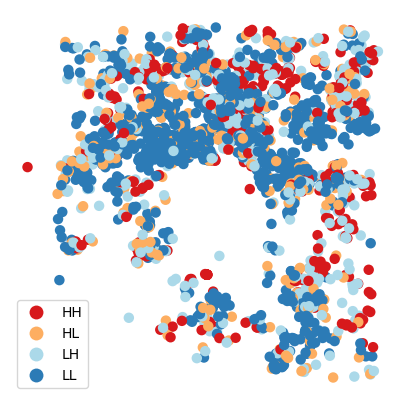

In [61]:
# Figure
f, ax = plt.subplots(1, figsize=(5,5))

# Plot quadrants HH, HL, LH, LL
esdaplot.lisa_cluster(price_local_I,
                      listings_gpd,
                      p=1,
                      ax=ax);

In [26]:
# Determine what's statistically significant correlation
alpha = 0.05
labels = 1* (price_local_I.p_sim < alpha)

# Add to data frame
listings_gpd = listings_gpd.assign( stat_cd = labels)
listings_gpd['stat_label'] = listings_gpd.stat_cd.map({0:'Not stat significant', 1:'stat significant'})

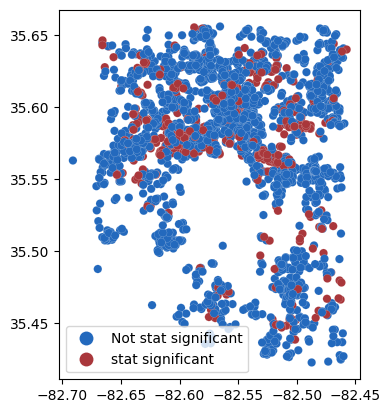

In [35]:
# Plot statistically significant correlation
listings_gpd.plot(
    column = 'stat_label',
    categorical=True,
    k=2,
    cmap='vlag',
    edgecolor = 'white',
    linewidth= 0.1,
    legend=True);

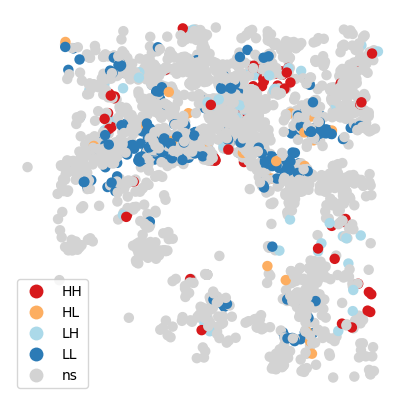

In [101]:
# Figure
f, ax = plt.subplots(1, figsize=(5,5))

# Plot quadrants statistically significant
esdaplot.lisa_cluster(price_local_I,
                      listings_gpd,
                      p=alpha, ax=ax);

In [34]:
# Get quadrants and p-values
quadrants = pd.DataFrame({'quadrant': price_local_I.q, 'p':price_local_I.p_sim})
quadrants['significant'] = labels
quadrants.quadrant.where(quadrants.p > alpha, other= 5, inplace=True )

# Add quadrants colors to variable in listings
listings['quadrants'] = quadrants.quadrant.map({1:'HH', 2:'LH', 3:'LL', 4:'HL', 5:'NS'})
listings['quadrants_colors'] = quadrants.quadrant.map({1:'red', 2:'lightblue', 3:'blue', 4:'orange', 5:'gray'})
listings.head(2)

,id,neighbourhood,property_type,bedrooms,beds,bathrooms,latitude,longitude,price,quadrants,quadrants_colors
0,108061,28801,Entire rental unit,1.0,1.0,1,35.6067,-82.55563,100.0,LL,blue
1,4394761,28801,Entire rental unit,2.0,1.0,1,35.61244,-82.55724,114.0,NS,gray


In [35]:
# Preparing data for plot
data = listings[['latitude','longitude', 'price']].values
data =data.tolist()

# Create a Base map with Folium
m = folium.Map(location= [35.5951, -82.5515], zoom_start=12)

for lat, lon, q, ptcolor in zip(listings.latitude, listings.longitude, listings.quadrants, listings.quadrants_colors):
  folium.CircleMarker(
     location=[lat, lon],
     radius=2,
     opacity=0.5,
     color=ptcolor,
     fill=True,
     fill_color=ptcolor,
     popup=q,
  ).add_to(m)

# Add a choropleth layer
folium.Choropleth(
    geo_data=asheville,
    name="choropleth",
    data=listings,
    columns=["neighbourhood", "price"],
    key_on="feature.properties.neighbourhood",
    fill_color="RdBu_r",
    fill_opacity=0.1,
    line_opacity=0.8,
    legend_name="Prices",
    show=True
).add_to(m)

# Layer Control (add/ Remove layers)
folium.LayerControl().add_to(m)

#Display
m